This notebook contains code of model which classifies mammals.

Dataset source: https://www.kaggle.com/datasets/asaniczka/mammals-image-classification-dataset-45-animals

# Imports

In [4]:
import cv2
import os
import random
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import zipfile
import seaborn as sns

from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Input, Dense, GlobalAveragePooling2D
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint
from tensorflow.keras.applications import Xception, VGG16, ResNet50, InceptionV3, DenseNet121, MobileNetV2
from tensorflow.keras.models import load_model

from google.colab import drive
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, f1_score

# Constants

In [1]:
mammals_classification_directory = '/content/gdrive/MyDrive/mammals_classification'
dataset_zip_file_name = 'mammals.zip'
dataset_dir_name = 'mammals'
log_directory_name = 'logs'
checkpoint_directory_name = 'checkpoints'
model_directory_name = 'models'

batch_size = 8
image_size = (80, 80)
input_shape = (80, 80, 3)

# Getting and preparing the dataset

Mounting with Google Drive

In [5]:
drive.mount('/content/gdrive')

Mounted at /content/gdrive


Extracting zip file with dataset

In [6]:
try:
    with zipfile.ZipFile(os.path.join(mammals_classification_directory, dataset_zip_file_name), 'r') as zip_ref:
        zip_ref.extractall()
except zipfile.BadZipFile:
    print('Not a zip file or a corrupted zip file')

## Loading images, preparing and labels

In [7]:
def load_img(indir):
    samples = []
    labels = []
    num_classes = 0
    for class_dir in os.listdir(indir):
        if not os.path.isdir(os.path.join(indir, class_dir)):
          continue
        print("Loading: ", class_dir)
        the_class = class_dir
        num_classes += 1
        for img_file in os.listdir(os.path.join(indir, class_dir)):
            image = cv2.imread("{}/{}/{}".format(indir, class_dir, img_file))
            image = cv2.resize(image, (128, 128))
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.normalize(image, None, 0, 1.0, cv2.NORM_MINMAX, dtype=cv2.CV_32F)
            samples.append(image)
            labels.append(the_class)
    samples = np.array(samples)
    labels = np.array(labels)
    return samples, labels, num_classes

In [8]:
samples, labels, num_classes = load_img(dataset_dir_name)

Loading:  groundhog
Loading:  wombat
Loading:  highland_cattle
Loading:  badger
Loading:  sea_lion
Loading:  giraffe
Loading:  armadillo
Loading:  brown_bear
Loading:  african_elephant
Loading:  koala
Loading:  jackal
Loading:  blue_whale
Loading:  tapir
Loading:  wildebeest
Loading:  sugar_glider
Loading:  snow_leopard
Loading:  american_bison
Loading:  seal
Loading:  horse
Loading:  zebra
Loading:  opossum
Loading:  weasel
Loading:  baboon
Loading:  warthog
Loading:  kangaroo
Loading:  orangutan
Loading:  water_buffalo
Loading:  arctic_fox
Loading:  anteater
Loading:  vampire_bat
Loading:  walrus
Loading:  porcupine
Loading:  squirrel
Loading:  rhinoceros
Loading:  yak
Loading:  polar_bear
Loading:  camel
Loading:  alpaca
Loading:  manatee
Loading:  mountain_goat
Loading:  vicuna
Loading:  dolphin
Loading:  red_panda
Loading:  mongoose
Loading:  otter


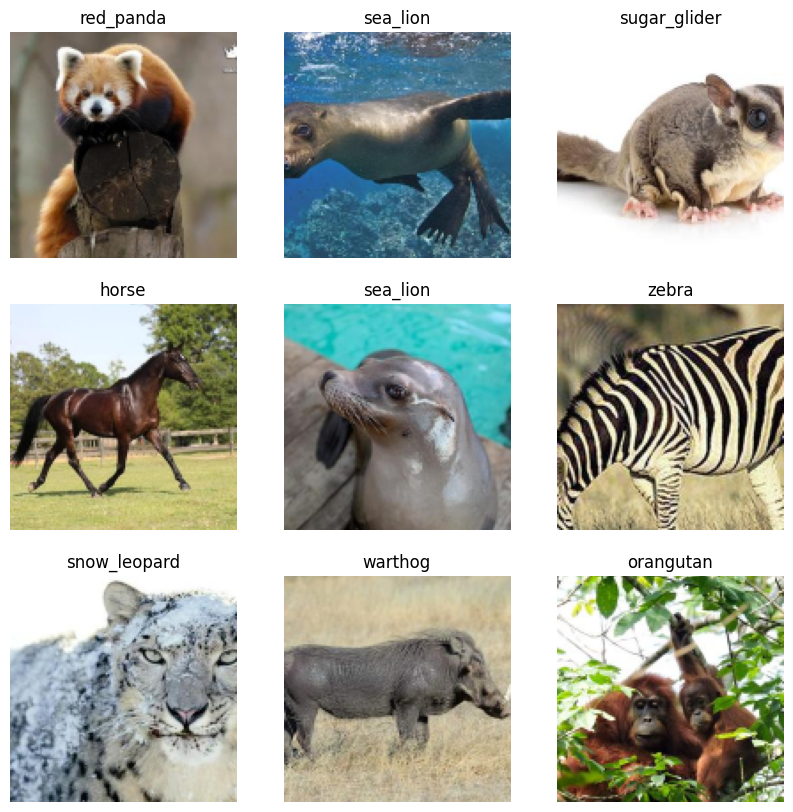

In [7]:
plt.figure(figsize=(10, 10))
for i in range(9):
    n = random.randrange(len(samples))
    plt.subplot(3, 3, i + 1)
    plt.imshow(samples[n])
    plt.title(labels[n])
    plt.axis("off")

In [9]:
print(labels)
print(num_classes)

['groundhog' 'groundhog' 'groundhog' ... 'otter' 'otter' 'otter']
45


## Preparing training, validation and test datasets

In [10]:
train_samples, val_samples, train_labels, val_labels = train_test_split(samples, labels, test_size = 0.3, random_state = 20, shuffle=True)
val_samples, test_samples, val_labels, test_labels = train_test_split(val_samples, val_labels, test_size = 0.3, random_state = 20, shuffle=True)

In [11]:
print(len(train_samples))
print(len(train_labels))
print(len(val_samples))
print(len(val_labels))
print(len(test_samples))
print(len(test_labels))

9625
9625
2888
2888
1238
1238


## Labels encoding

In [12]:
one_hot_encoder = OneHotEncoder(max_categories=num_classes, handle_unknown='ignore')

train_labels_encoded = one_hot_encoder.fit_transform(train_labels.reshape(-1, 1)).todense()
print("Train labels shape: ", train_labels_encoded.shape)

val_labels_encoded = one_hot_encoder.transform(val_labels.reshape(-1, 1)).todense()
print("Val labels shape: ", val_labels_encoded.shape)

test_labels_encoded = one_hot_encoder.transform(test_labels.reshape(-1, 1)).todense()
print("Test labels shape: ", test_labels_encoded.shape)

Train labels shape:  (9625, 45)
Val labels shape:  (2888, 45)
Test labels shape:  (1238, 45)


In [13]:
print(train_labels_encoded)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


# Experimenting with models

## Xception

In [ ]:
base_xception = Xception(include_top = False, weights = 'imagenet')
avg = GlobalAveragePooling2D()(base_xception.output)
out = Dense(num_classes, activation="softmax")(avg)
xception = Model(inputs=base_xception.input, outputs=out)

In [ ]:
for layer in base_xception.layers:
  layer.trainable = False

In [ ]:
xception.summary()
xception.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, None, None, 32)       864       ['input_2[0][0]']             
                                                                                                  
 block1_conv1_bn (BatchNorm  (None, None, None, 32)       128       ['block1_conv1[0][0]']        
 alization)                                                                                       
                                                                                                  
 block1_conv1_act (Activati  (None, None, None, 32)       0         ['block1_conv1_bn[0][0]'] 

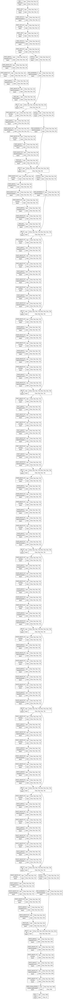

In [ ]:
model_image_path = os.path.join(mammals_classification_directory, os.path.join(model_directory_name, 'xception/xception.png'))
tf.keras.utils.plot_model(xception, to_file=model_image_path, show_shapes=True, show_layer_names=True, show_dtype=True, dpi=80)

In [ ]:
tensorboard = TensorBoard(log_dir=os.path.join(mammals_classification_directory, os.path.join(log_directory_name, 'xception')))
checkpoint = ModelCheckpoint(filepath=os.path.join(mammals_classification_directory, os.path.join(checkpoint_directory_name, 'xception/xception_checkpoint.h5')),
                             monitor='val_accuracy',
                             save_best_only=True,
                             save_weights_only=False,
                             verbose=1
                            )
early_stopping = tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True)

In [ ]:
xception_history = xception.fit(train_samples, train_labels_encoded,
                                      batch_size = batch_size,
                                      epochs = 50,
                                      validation_data = (val_samples, val_labels_encoded),
                                      callbacks=[tensorboard, checkpoint, early_stopping])

Epoch 1/50
1204/1204 [==============================] - ETA: 0s - loss: 0.9612 - accuracy: 0.7404
Epoch 1: val_accuracy improved from -inf to 0.80956, saving model to /content/gdrive/MyDrive/mammals_classification/checkpoints/xception/xception_checkpoint.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1204/1204 [==============================] - 43s 31ms/step - loss: 0.9612 - accuracy: 0.7404 - val_loss: 0.7331 - val_accuracy: 0.8096
Epoch 2/50
1204/1204 [==============================] - ETA: 0s - loss: 0.4584 - accuracy: 0.8687
Epoch 2: val_accuracy did not improve from 0.80956
1204/1204 [==============================] - 24s 20ms/step - loss: 0.4584 - accuracy: 0.8687 - val_loss: 0.7714 - val_accuracy: 0.8071
Epoch 3/50
1201/1204 [============================>.] - ETA: 0s - loss: 0.2857 - accuracy: 0.9130
Epoch 3: val_accuracy did not improve from 0.80956
1204/1204 [==============================] - 24s 20ms/step - loss: 0.2869 - accuracy: 0.9127 - val_loss: 0.8547 - val_accuracy: 0.8009
Epoch 4/50
1202/1204 [============================>.] - ETA: 0s - loss: 0.2017 - accuracy: 0.9402
Epoch 4: val_accuracy did not improve from 0.80956
1204/1204 [==============================] - 24s 20ms/step - loss: 0.2019 - accuracy: 0.9402 - val_loss: 0.9258 - val_accuracy: 0.8030
Epoch 5/50
12

In [ ]:
xception_hist_ = pd.DataFrame(xception_history.history)
xception_hist_

,loss,accuracy,val_loss,val_accuracy
0,0.961244,0.740364,0.733072,0.809557
1,0.458408,0.868675,0.771405,0.807133
2,0.286893,0.912727,0.854723,0.800900
3,0.201929,0.940156,0.925802,0.802978
4,0.145612,0.957506,0.866233,0.816136
5,0.122156,0.961766,0.928226,0.814058


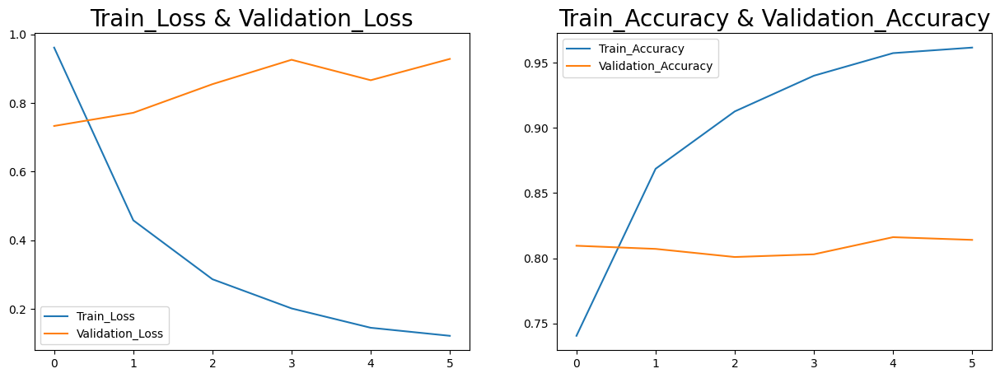

In [ ]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(xception_hist_['loss'], label='Train_Loss')
plt.plot(xception_hist_['val_loss'], label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss', fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(xception_hist_['accuracy'], label='Train_Accuracy')
plt.plot(xception_hist_['val_accuracy'], label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy', fontsize=20)
plt.legend()

In [ ]:
xception.save(os.path.join(mammals_classification_directory, os.path.join(model_directory_name, 'xception/xception-with-frozen-layers.h5')))

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
for layer in base_xception.layers:
  layer.trainable = True

In [ ]:
optimizer = tf.keras.optimizers.legacy.SGD(lr=0.01, momentum=0.9, decay=0.001)
xception.compile(optimizer = optimizer, loss = 'categorical_crossentropy', metrics = ['accuracy'])

/usr/local/lib/python3.10/dist-packages/keras/src/optimizers/legacy/gradient_descent.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [ ]:
xception_history = xception.fit(train_samples, train_labels_encoded,
                                      batch_size = batch_size,
                                      epochs = 50,
                                      validation_data = (val_samples, val_labels_encoded),
                                      callbacks=[tensorboard, checkpoint, early_stopping])

Epoch 1/50
1204/1204 [==============================] - ETA: 0s - loss: 1.3007 - accuracy: 0.6400
Epoch 1: val_accuracy improved from -inf to 0.79363, saving model to /content/gdrive/MyDrive/mammals_classification/checkpoints/xception/xception_checkpoint.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1204/1204 [==============================] - 84s 62ms/step - loss: 1.3007 - accuracy: 0.6400 - val_loss: 0.8144 - val_accuracy: 0.7936
Epoch 2/50
1203/1204 [============================>.] - ETA: 0s - loss: 0.4389 - accuracy: 0.8733
Epoch 2: val_accuracy improved from 0.79363 to 0.82999, saving model to /content/gdrive/MyDrive/mammals_classification/checkpoints/xception/xception_checkpoint.h5
1204/1204 [==============================] - 85s 71ms/step - loss: 0.4393 - accuracy: 0.8732 - val_loss: 1.2628 - val_accuracy: 0.8300
Epoch 3/50
1203/1204 [============================>.] - ETA: 0s - loss: 0.1756 - accuracy: 0.9499
Epoch 3: val_accuracy improved from 0.82999 to 0.86565, saving model to /content/gdrive/MyDrive/mammals_classification/checkpoints/xception/xception_checkpoint.h5
1204/1204 [==============================] - 81s 67ms/step - loss: 0.1760 - accuracy: 0.9498 - val_loss: 0.6210 - val_accuracy: 0.8657
Epoch 4/50
1203/1204 [============================>.] - ETA: 0s - loss: 0

In [ ]:
xception_hist_ = pd.DataFrame(xception_history.history)
xception_hist_

,loss,accuracy,val_loss,val_accuracy
0,1.300724,0.640000,0.814363,0.793629
1,0.439338,0.873247,1.262764,0.829986
2,0.176003,0.949818,0.621022,0.865651
3,0.104500,0.970286,0.530047,0.878116
4,0.067748,0.981922,0.491333,0.886427
5,0.051457,0.986182,0.461142,0.893352
6,0.045174,0.988779,0.458056,0.893352
7,0.037592,0.990649,0.463008,0.897507
8,0.035790,0.991169,0.460169,0.895429
9,0.031557,0.992104,0.455207,0.896468


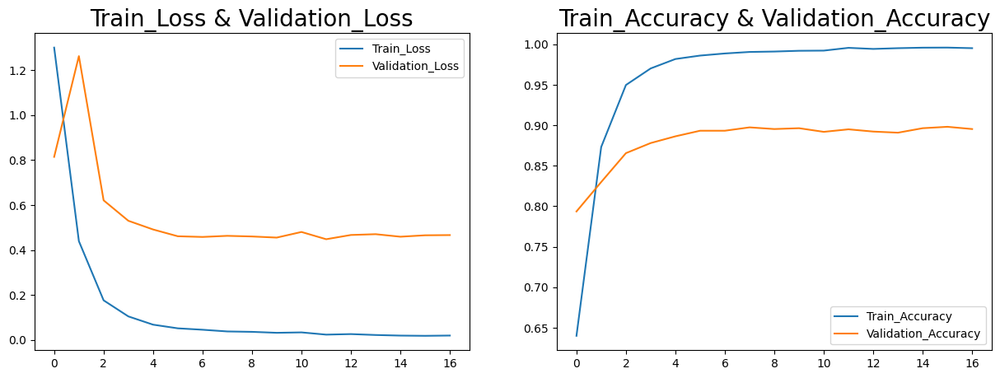

In [ ]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(xception_hist_['loss'], label='Train_Loss')
plt.plot(xception_hist_['val_loss'], label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss', fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(xception_hist_['accuracy'], label='Train_Accuracy')
plt.plot(xception_hist_['val_accuracy'], label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy', fontsize=20)
plt.legend()

In [ ]:
xception.save(os.path.join(mammals_classification_directory, os.path.join(model_directory_name, 'xception/xception.h5')))

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


## VGG

In [ ]:
base_vgg = VGG16(include_top = False, weights = 'imagenet')
avg = GlobalAveragePooling2D()(base_vgg.output)
out = Dense(num_classes, activation="softmax")(avg)
vgg = Model(inputs=base_vgg.input, outputs=out)

58889256/58889256 [==============================] - 0s 0us/step


In [ ]:
for layer in base_vgg.layers:
  layer.trainable = False

In [ ]:
vgg.summary()
vgg.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

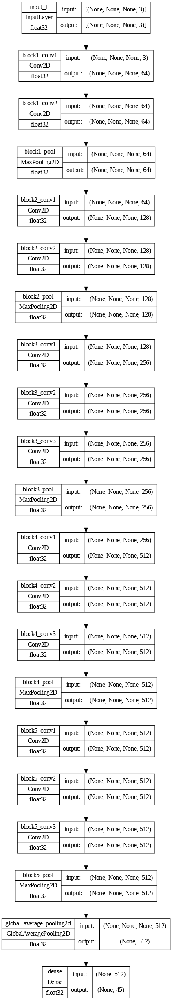

In [ ]:
model_image_path = os.path.join(mammals_classification_directory, os.path.join(model_directory_name, 'vgg/vgg.png'))
tf.keras.utils.plot_model(vgg, to_file=model_image_path, show_shapes=True, show_layer_names=True, show_dtype=True, dpi=80)

In [ ]:
tensorboard = TensorBoard(log_dir=os.path.join(mammals_classification_directory, os.path.join(log_directory_name, 'vgg')))
checkpoint = ModelCheckpoint(filepath=os.path.join(mammals_classification_directory, os.path.join(checkpoint_directory_name, 'vgg/vgg_checkpoint.h5')),
                             monitor='val_accuracy',
                             save_best_only=True,
                             save_weights_only=False,
                             verbose=1
                            )
early_stopping = tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True)

In [ ]:
vgg_history = vgg.fit(train_samples, train_labels_encoded,
                                      batch_size = batch_size,
                                      epochs = 50,
                                      validation_data = (val_samples, val_labels_encoded),
                                      callbacks=[tensorboard, checkpoint, early_stopping])

Epoch 1/50
1204/1204 [==============================] - ETA: 0s - loss: 3.0493 - accuracy: 0.2687
Epoch 1: val_accuracy improved from -inf to 0.41517, saving model to /content/gdrive/MyDrive/mammals_classification/checkpoints/vgg/vgg_checkpoint.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1204/1204 [==============================] - 44s 32ms/step - loss: 3.0493 - accuracy: 0.2687 - val_loss: 2.5296 - val_accuracy: 0.4152
Epoch 2/50
1203/1204 [============================>.] - ETA: 0s - loss: 2.2584 - accuracy: 0.4618
Epoch 2: val_accuracy improved from 0.41517 to 0.49584, saving model to /content/gdrive/MyDrive/mammals_classification/checkpoints/vgg/vgg_checkpoint.h5
1204/1204 [==============================] - 34s 28ms/step - loss: 2.2582 - accuracy: 0.4618 - val_loss: 2.1217 - val_accuracy: 0.4958
Epoch 3/50
1201/1204 [============================>.] - ETA: 0s - loss: 1.9358 - accuracy: 0.5262
Epoch 3: val_accuracy improved from 0.49584 to 0.52147, saving model to /content/gdrive/MyDrive/mammals_classification/checkpoints/vgg/vgg_checkpoint.h5
1204/1204 [==============================] - 34s 28ms/step - loss: 1.9358 - accuracy: 0.5261 - val_loss: 1.9330 - val_accuracy: 0.5215
Epoch 4/50
1202/1204 [============================>.] - ETA: 0s - loss: 1.7441 - accuracy: 0.

In [ ]:
vgg_hist_ = pd.DataFrame(vgg_history.history)
vgg_hist_

,loss,accuracy,val_loss,val_accuracy
0,3.049285,0.268675,2.529593,0.415166
1,2.258248,0.461818,2.121699,0.495845
2,1.935761,0.526130,1.933034,0.521468
3,1.744025,0.562494,1.798717,0.539820
4,1.612147,0.592519,1.728122,0.547438
5,1.510780,0.614338,1.654552,0.558518
6,1.430296,0.633351,1.603188,0.583795
7,1.366470,0.648208,1.561769,0.591759
8,1.307922,0.659117,1.539021,0.591066
9,1.261576,0.670753,1.518946,0.595568


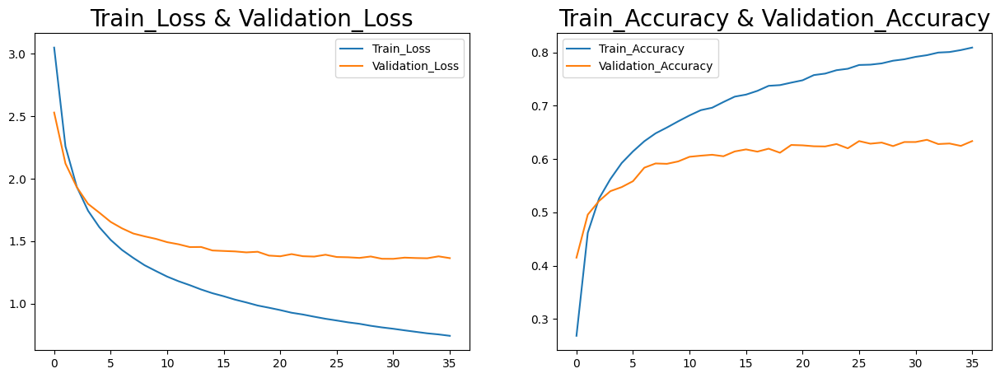

In [ ]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(vgg_hist_['loss'], label='Train_Loss')
plt.plot(vgg_hist_['val_loss'], label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss', fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(vgg_hist_['accuracy'], label='Train_Accuracy')
plt.plot(vgg_hist_['val_accuracy'], label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy', fontsize=20)
plt.legend()

In [ ]:
vgg.save(os.path.join(mammals_classification_directory, os.path.join(model_directory_name, 'vgg/vgg-with-frozen-layers.h5')))

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


This models learned slowly and accuracy is worse than Xception's accuracy, so VGG will not be trained longer.

## ResNet

In [21]:
base_resnet = ResNet50(include_top = False, weights = 'imagenet')
avg = GlobalAveragePooling2D()(base_resnet.input)
out = Dense(num_classes, activation = 'softmax')(avg)
resnet = Model(inputs=base_resnet.input, outputs=out)

94765736/94765736 [==============================] - 3s 0us/step


In [22]:
for layer in base_resnet.layers:
  layer.trainable = False

In [23]:
resnet.summary()
resnet.compile(optimizer='adam', loss = 'categorical_crossentropy', metrics=['accuracy'])

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 global_average_pooling2d_1  (None, 3)                 0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_1 (Dense)             (None, 45)                180       
                                                                 
Total params: 180 (720.00 Byte)
Trainable params: 180 (720.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


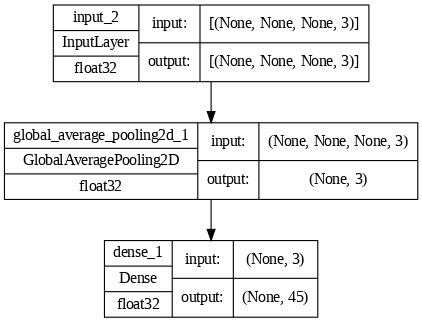

In [24]:
model_image_path = os.path.join(mammals_classification_directory, os.path.join(model_directory_name, 'resnet/resnet.png'))
tf.keras.utils.plot_model(resnet, to_file=model_image_path, show_shapes=True, show_layer_names=True, show_dtype=True, dpi=80)

In [ ]:
tensorboard = TensorBoard(log_dir=os.path.join(mammals_classification_directory, os.path.join(log_directory_name, 'resnet')))
checkpoint = ModelCheckpoint(filepath=os.path.join(mammals_classification_directory, os.path.join(checkpoint_directory_name, 'resnet/resnet_checkpoint.h5')),
                             monitor='val_accuracy',
                             save_best_only=True,
                             save_weights_only=False,
                             verbose=1
                            )
early_stopping = tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True)

In [ ]:
resnet_history = resnet.fit(train_samples, train_labels_encoded,
                                      batch_size = batch_size,
                                      epochs = 50,
                                      validation_data = (val_samples, val_labels_encoded),
                                      callbacks=[tensorboard, checkpoint, early_stopping])

Epoch 1/50
1204/1204 [==============================] - ETA: 0s - loss: 3.7023 - accuracy: 0.0566
Epoch 1: val_accuracy improved from -inf to 0.07652, saving model to /content/gdrive/MyDrive/mammals_classification/checkpoints/resnet/resnet_checkpoint.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1204/1204 [==============================] - 9s 5ms/step - loss: 3.7023 - accuracy: 0.0566 - val_loss: 3.5821 - val_accuracy: 0.0765
Epoch 2/50
1199/1204 [============================>.] - ETA: 0s - loss: 3.5301 - accuracy: 0.0845
Epoch 2: val_accuracy improved from 0.07652 to 0.09349, saving model to /content/gdrive/MyDrive/mammals_classification/checkpoints/resnet/resnet_checkpoint.h5
1204/1204 [==============================] - 6s 5ms/step - loss: 3.5291 - accuracy: 0.0848 - val_loss: 3.5065 - val_accuracy: 0.0935
Epoch 3/50
1203/1204 [============================>.] - ETA: 0s - loss: 3.4885 - accuracy: 0.0928
Epoch 3: val_accuracy improved from 0.09349 to 0.10076, saving model to /content/gdrive/MyDrive/mammals_classification/checkpoints/resnet/resnet_checkpoint.h5
1204/1204 [==============================] - 6s 5ms/step - loss: 3.4885 - accuracy: 0.0928 - val_loss: 3.4939 - val_accuracy: 0.1008
Epoch 4/50
1194/1204 [============================>.] - ETA: 0s - loss: 3.4780 - accura

In [ ]:
resnet_hist_ = pd.DataFrame(resnet_history.history)
resnet_hist_

,loss,accuracy,val_loss,val_accuracy
0,3.702282,0.056623,3.582127,0.076524
1,3.529065,0.084779,3.506511,0.093490
2,3.488544,0.092779,3.493934,0.100762
3,3.478243,0.092364,3.490488,0.093490
4,3.472369,0.098701,3.487155,0.098684
5,3.468055,0.096416,3.478757,0.102839
6,3.466029,0.098701,3.471040,0.104224
7,3.461705,0.099221,3.481428,0.101454
8,3.457785,0.100883,3.476549,0.102147
9,3.456831,0.100156,3.472481,0.105263


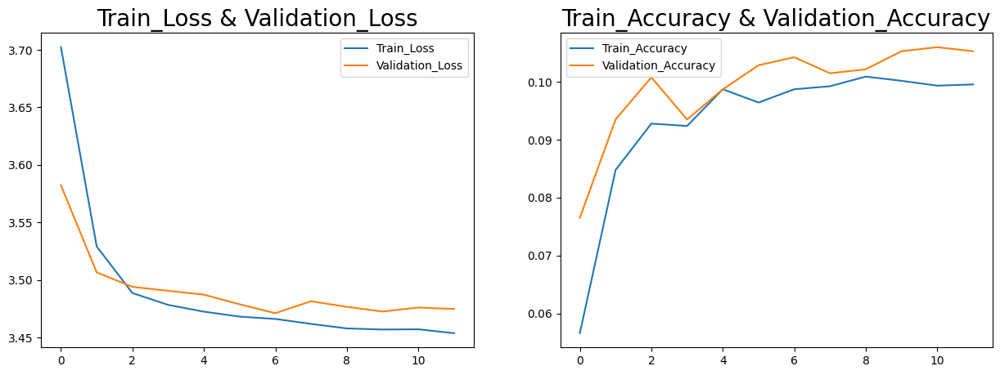

In [ ]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(resnet_hist_['loss'], label='Train_Loss')
plt.plot(resnet_hist_['val_loss'], label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss', fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(resnet_hist_['accuracy'], label='Train_Accuracy')
plt.plot(resnet_hist_['val_accuracy'], label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy', fontsize=20)
plt.legend()

Accuracy of this model is so low that it has no sense for futher learning, other models are more promising.

## Inception

In [ ]:
base_inception = InceptionV3(include_top = False, weights = 'imagenet')
avg = GlobalAveragePooling2D()(base_inception.output)
out = Dense(num_classes, activation="softmax")(avg)
inception = Model(inputs=base_inception.input, outputs=out)

87910968/87910968 [==============================] - 1s 0us/step


In [ ]:
for layer in base_inception.layers:
  layer.trainable = False

In [ ]:
inception.summary()
inception.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, None, None, 32)       864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, None, None, 32)       96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, None, None, 32)       0         ['batch_normalization[0][0

In [ ]:
model_image_path = os.path.join(mammals_classification_directory, os.path.join(model_directory_name, 'inception/inception.png'))
tf.keras.utils.plot_model(inception, to_file=model_image_path, show_shapes=True, show_layer_names=True, show_dtype=True, dpi=80)

In [ ]:
tensorboard = TensorBoard(log_dir=os.path.join(mammals_classification_directory, os.path.join(log_directory_name, 'inception')))
checkpoint = ModelCheckpoint(filepath=os.path.join(mammals_classification_directory, os.path.join(checkpoint_directory_name, 'inception/inception_checkpoint.h5')),
                             monitor='val_accuracy',
                             save_best_only=True,
                             save_weights_only=False,
                             verbose=1
                            )
early_stopping = tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True)

In [ ]:
inception_history = inception.fit(train_samples, train_labels_encoded,
                                      batch_size = batch_size,
                                      epochs = 50,
                                      validation_data = (val_samples, val_labels_encoded),
                                      callbacks=[tensorboard, checkpoint, early_stopping])

Epoch 1/50
1204/1204 [==============================] - ETA: 0s - loss: 2.3192 - accuracy: 0.6128
Epoch 1: val_accuracy improved from -inf to 0.64231, saving model to /content/gdrive/MyDrive/mammals_classification/checkpoints/inception/inception_checkpoint.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1204/1204 [==============================] - 38s 25ms/step - loss: 2.3192 - accuracy: 0.6128 - val_loss: 2.4498 - val_accuracy: 0.6423
Epoch 2/50
1202/1204 [============================>.] - ETA: 0s - loss: 1.3845 - accuracy: 0.7625
Epoch 2: val_accuracy improved from 0.64231 to 0.68317, saving model to /content/gdrive/MyDrive/mammals_classification/checkpoints/inception/inception_checkpoint.h5
1204/1204 [==============================] - 31s 25ms/step - loss: 1.3841 - accuracy: 0.7625 - val_loss: 2.3724 - val_accuracy: 0.6832
Epoch 3/50
1202/1204 [============================>.] - ETA: 0s - loss: 1.0249 - accuracy: 0.8115
Epoch 3: val_accuracy did not improve from 0.68317
1204/1204 [==============================] - 25s 20ms/step - loss: 1.0267 - accuracy: 0.8113 - val_loss: 2.9154 - val_accuracy: 0.6714
Epoch 4/50
1201/1204 [============================>.] - ETA: 0s - loss: 0.7688 - accuracy: 0.8548
Epoch 4: val_accuracy improved from 0.68317 to 0.72507, saving model to /content/gdri

In [ ]:
inception_hist_ = pd.DataFrame(inception_history.history)
inception_hist_

,loss,accuracy,val_loss,val_accuracy
0,2.319201,0.612779,2.449791,0.642313
1,1.384059,0.762493,2.372413,0.683172
2,1.026663,0.811325,2.915405,0.671399
3,0.769989,0.854753,2.457802,0.725069
4,0.644080,0.872831,2.698649,0.725069
5,0.525566,0.894442,3.131415,0.704294
6,0.531578,0.899532,3.247670,0.716759


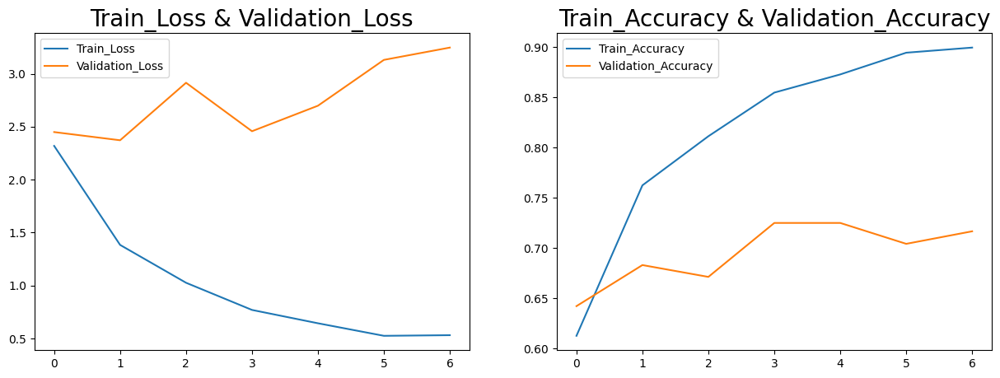

In [ ]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(inception_hist_['loss'], label='Train_Loss')
plt.plot(inception_hist_['val_loss'], label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss', fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(inception_hist_['accuracy'], label='Train_Accuracy')
plt.plot(inception_hist_['val_accuracy'], label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy', fontsize=20)
plt.legend()

In [ ]:
inception.save(os.path.join(mammals_classification_directory, os.path.join(model_directory_name, 'inception/inception-with-frozen-layers.h5')))

In [ ]:
for layer in base_inception.layers:
  layer.trainable = True

In [ ]:
optimizer = tf.keras.optimizers.legacy.SGD(lr=0.01, momentum=0.9, decay=0.001)
inception.compile(optimizer = optimizer, loss = 'categorical_crossentropy', metrics = ['accuracy'])

/usr/local/lib/python3.10/dist-packages/keras/src/optimizers/legacy/gradient_descent.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [ ]:
inception_history = inception.fit(train_samples, train_labels_encoded,
                                      batch_size = batch_size,
                                      epochs = 20,
                                      validation_data = (val_samples, val_labels_encoded),
                                      callbacks=[tensorboard, checkpoint, early_stopping])

Epoch 1/20
1204/1204 [==============================] - ETA: 0s - loss: 4.0772 - accuracy: 0.0334
Epoch 1: val_accuracy improved from -inf to 0.03843, saving model to /content/gdrive/MyDrive/mammals_classification/checkpoints/inception/inception_checkpoint.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1204/1204 [==============================] - 79s 55ms/step - loss: 4.0772 - accuracy: 0.0334 - val_loss: 6.3459 - val_accuracy: 0.0384
Epoch 2/20
1203/1204 [============================>.] - ETA: 0s - loss: 3.7874 - accuracy: 0.0401
Epoch 2: val_accuracy improved from 0.03843 to 0.03913, saving model to /content/gdrive/MyDrive/mammals_classification/checkpoints/inception/inception_checkpoint.h5
1204/1204 [==============================] - 69s 58ms/step - loss: 3.7875 - accuracy: 0.0401 - val_loss: 29.4898 - val_accuracy: 0.0391
Epoch 3/20
1204/1204 [==============================] - ETA: 0s - loss: 3.6776 - accuracy: 0.0572
Epoch 3: val_accuracy improved from 0.03913 to 0.06925, saving model to /content/gdrive/MyDrive/mammals_classification/checkpoints/inception/inception_checkpoint.h5
1204/1204 [==============================] - 70s 59ms/step - loss: 3.6776 - accuracy: 0.0572 - val_loss: 9.4300 - val_accuracy: 0.0693
Epoch 4/20
1203/1204 [============================>.] - ETA: 0s - lo

In [ ]:
inception_hist_ = pd.DataFrame(inception_history.history)
inception_hist_

,loss,accuracy,val_loss,val_accuracy
0,4.077155,0.033351,6.345901,0.038435
1,3.787491,0.040104,29.489826,0.039127
2,3.677598,0.057247,9.429952,0.069252
3,3.612601,0.074078,11.297052,0.074446
4,3.521901,0.083948,7.470366,0.101108
5,3.467054,0.092675,10.276637,0.113920


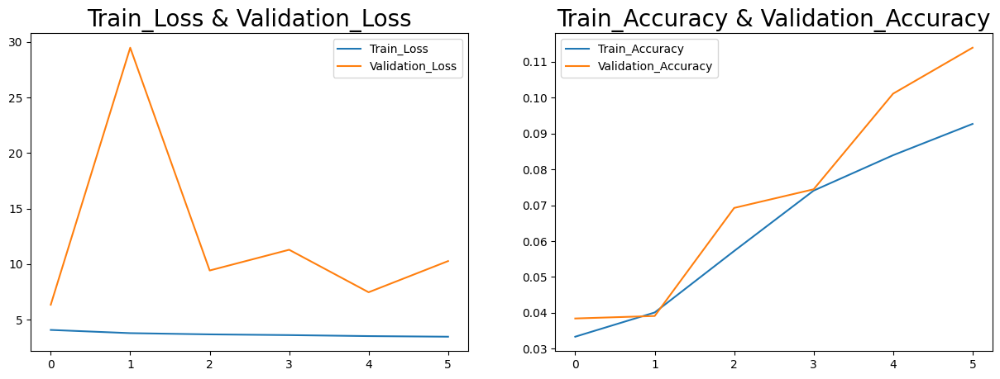

In [ ]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(inception_hist_['loss'], label='Train_Loss')
plt.plot(inception_hist_['val_loss'], label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss', fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(inception_hist_['accuracy'], label='Train_Accuracy')
plt.plot(inception_hist_['val_accuracy'], label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy', fontsize=20)
plt.legend()

Model trained with frozen layers was better than this one, so current model (with all trainable layers) will not be saved.

## DenseNet

In [ ]:
base_dense_net = DenseNet121(include_top = False, weights = 'imagenet')
avg = GlobalAveragePooling2D()(base_dense_net.output)
out = Dense(num_classes, activation="softmax")(avg)
dense_net = Model(inputs=base_dense_net.input, outputs=out)

29084464/29084464 [==============================] - 0s 0us/step


In [ ]:
for layer in base_dense_net.layers:
  layer.trainable = False

In [ ]:
dense_net.summary()
dense_net.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, None, None, 3)        0         ['input_1[0][0]']             
 g2D)                                                                                             
                                                                                                  
 conv1/conv (Conv2D)         (None, None, None, 64)       9408      ['zero_padding2d[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalizati  (None, None, None, 64)       256       ['conv1/conv[0][0]']      

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.648903 to fit



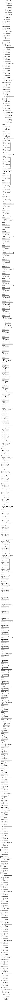

In [ ]:
model_image_path = os.path.join(mammals_classification_directory, os.path.join(model_directory_name, 'dense_net/dense_net.png'))
tf.keras.utils.plot_model(dense_net, to_file=model_image_path, show_shapes=True, show_layer_names=True, show_dtype=True, dpi=80)

In [ ]:
tensorboard = TensorBoard(log_dir=os.path.join(mammals_classification_directory, os.path.join(log_directory_name, 'dense_net')))
checkpoint = ModelCheckpoint(filepath=os.path.join(mammals_classification_directory, os.path.join(checkpoint_directory_name, 'dense_net/dense_net_checkpoint.h5')),
                             monitor='val_accuracy',
                             save_best_only=True,
                             save_weights_only=False,
                             verbose=1
                            )
early_stopping = tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True)

In [ ]:
dense_net_history = dense_net.fit(train_samples, train_labels_encoded,
                                      batch_size = batch_size,
                                      epochs = 50,
                                      validation_data = (val_samples, val_labels_encoded),
                                      callbacks=[tensorboard, checkpoint, early_stopping])

Epoch 1/50
1204/1204 [==============================] - ETA: 0s - loss: 1.1371 - accuracy: 0.6999
Epoch 1: val_accuracy improved from -inf to 0.80921, saving model to /content/gdrive/MyDrive/mammals_classification/checkpoints/dense_net/dense_net_checkpoint.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1204/1204 [==============================] - 52s 34ms/step - loss: 1.1371 - accuracy: 0.6999 - val_loss: 0.6802 - val_accuracy: 0.8092
Epoch 2/50
1203/1204 [============================>.] - ETA: 0s - loss: 0.4547 - accuracy: 0.8658
Epoch 2: val_accuracy improved from 0.80921 to 0.82029, saving model to /content/gdrive/MyDrive/mammals_classification/checkpoints/dense_net/dense_net_checkpoint.h5
1204/1204 [==============================] - 31s 26ms/step - loss: 0.4546 - accuracy: 0.8658 - val_loss: 0.6731 - val_accuracy: 0.8203
Epoch 3/50
1204/1204 [==============================] - ETA: 0s - loss: 0.3199 - accuracy: 0.9022
Epoch 3: val_accuracy improved from 0.82029 to 0.84349, saving model to /content/gdrive/MyDrive/mammals_classification/checkpoints/dense_net/dense_net_checkpoint.h5
1204/1204 [==============================] - 36s 30ms/step - loss: 0.3199 - accuracy: 0.9022 - val_loss: 0.6240 - val_accuracy: 0.8435
Epoch 4/50
1202/1204 [============================>.] - ETA: 0s - los

In [ ]:
dense_net_hist_ = pd.DataFrame(dense_net_history.history)
dense_net_hist_

,loss,accuracy,val_loss,val_accuracy
0,1.137126,0.699948,0.680191,0.809211
1,0.454614,0.865766,0.673085,0.820291
2,0.319949,0.902234,0.624026,0.843490
3,0.254703,0.920727,0.693240,0.821676
4,0.181819,0.942545,0.650494,0.843144
5,0.154590,0.950234,0.748568,0.836911
6,0.127789,0.958234,0.720065,0.849723
7,0.098496,0.968520,0.713569,0.851108


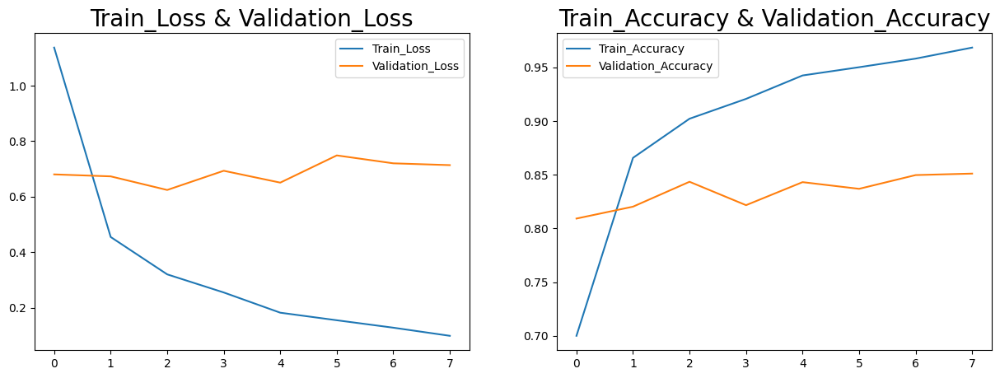

In [ ]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(dense_net_hist_['loss'], label='Train_Loss')
plt.plot(dense_net_hist_['val_loss'], label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss', fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(dense_net_hist_['accuracy'], label='Train_Accuracy')
plt.plot(dense_net_hist_['val_accuracy'], label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy', fontsize=20)
plt.legend()

In [ ]:
dense_net.save(os.path.join(mammals_classification_directory, os.path.join(model_directory_name, 'dense_net/dense_net-with-frozen-layers.h5')))

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
for layer in base_dense_net.layers:
  layer.trainable = True

In [ ]:
optimizer = tf.keras.optimizers.legacy.SGD(lr=0.01, momentum=0.9, decay=0.001)
dense_net.compile(optimizer = optimizer, loss = 'categorical_crossentropy', metrics = ['accuracy'])

/usr/local/lib/python3.10/dist-packages/keras/src/optimizers/legacy/gradient_descent.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [ ]:
dense_net_history = dense_net.fit(train_samples, train_labels_encoded,
                                      batch_size = batch_size,
                                      epochs = 50,
                                      validation_data = (val_samples, val_labels_encoded),
                                      callbacks=[tensorboard, checkpoint, early_stopping])

Epoch 1/50
1204/1204 [==============================] - ETA: 0s - loss: 1.2966 - accuracy: 0.6251
Epoch 1: val_accuracy improved from -inf to 0.41620, saving model to /content/gdrive/MyDrive/mammals_classification/checkpoints/dense_net/dense_net_checkpoint.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1204/1204 [==============================] - 85s 60ms/step - loss: 1.2966 - accuracy: 0.6251 - val_loss: 4.1654 - val_accuracy: 0.4162
Epoch 2/50
1203/1204 [============================>.] - ETA: 0s - loss: 1.1532 - accuracy: 0.6673
Epoch 2: val_accuracy improved from 0.41620 to 0.45429, saving model to /content/gdrive/MyDrive/mammals_classification/checkpoints/dense_net/dense_net_checkpoint.h5
1204/1204 [==============================] - 75s 62ms/step - loss: 1.1535 - accuracy: 0.6672 - val_loss: 5.3503 - val_accuracy: 0.4543
Epoch 3/50
1204/1204 [==============================] - ETA: 0s - loss: 1.0518 - accuracy: 0.6926
Epoch 3: val_accuracy did not improve from 0.45429
1204/1204 [==============================] - 64s 53ms/step - loss: 1.0518 - accuracy: 0.6926 - val_loss: 3.7814 - val_accuracy: 0.4543
Epoch 4/50
1204/1204 [==============================] - ETA: 0s - loss: 0.9613 - accuracy: 0.7196
Epoch 4: val_accuracy did not improve from 0.45429
1204/1204 [=======================

In [ ]:
dense_net_hist_ = pd.DataFrame(dense_net_history.history)
dense_net_hist_

,loss,accuracy,val_loss,val_accuracy
0,1.296632,0.625143,4.165395,0.416205
1,1.153501,0.667221,5.350287,0.454294
2,1.051810,0.692571,3.781445,0.454294
3,0.961346,0.719584,4.540891,0.406163
4,0.853129,0.753766,4.414390,0.425900
5,0.758912,0.788883,4.215569,0.427978
6,0.678348,0.806753,4.367801,0.462604
7,0.616854,0.827117,4.110314,0.463643


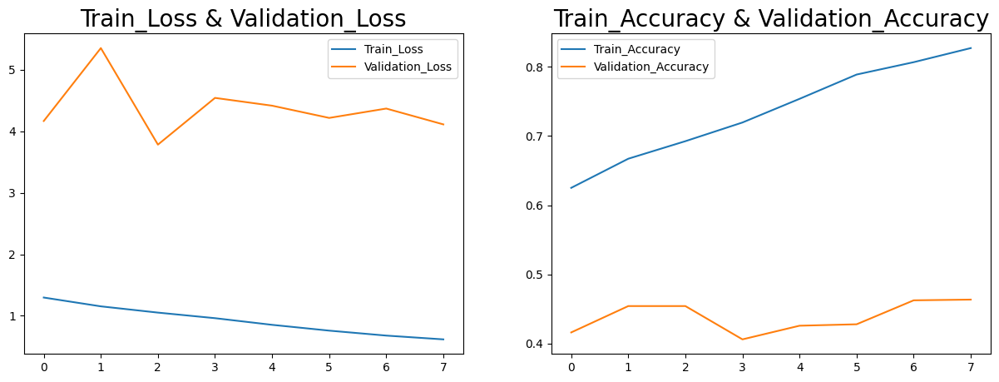

In [ ]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(dense_net_hist_['loss'], label='Train_Loss')
plt.plot(dense_net_hist_['val_loss'], label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss', fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(dense_net_hist_['accuracy'], label='Train_Accuracy')
plt.plot(dense_net_hist_['val_accuracy'], label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy', fontsize=20)
plt.legend()

Model trained with frozen layers was better than this one, so current model (with all trainable layers) will not be saved.

## MobileNet

In [12]:
base_mobile_net = MobileNetV2(include_top = False, weights = 'imagenet')
avg = GlobalAveragePooling2D()(base_mobile_net.output)
out = Dense(num_classes, activation="softmax")(avg)
mobile_net = Model(inputs=base_mobile_net.input, outputs=out)

9406464/9406464 [==============================] - 1s 0us/step


In [13]:
for layer in base_mobile_net.layers:
  layer.trainable = False

In [14]:
mobile_net.summary()
mobile_net.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, None, None, 32)       864       ['input_1[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, None, None, 32)       128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, None, None, 32)       0         ['bn_Conv1[0][0]']        

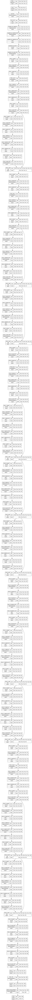

In [15]:
model_image_path = os.path.join(mammals_classification_directory, os.path.join(model_directory_name, 'mobile_net/mobile_net.png'))
tf.keras.utils.plot_model(mobile_net, to_file=model_image_path, show_shapes=True, show_layer_names=True, show_dtype=True, dpi=80)

In [16]:
tensorboard = TensorBoard(log_dir=os.path.join(mammals_classification_directory, os.path.join(log_directory_name, 'mobile_net')))
checkpoint = ModelCheckpoint(filepath=os.path.join(mammals_classification_directory, os.path.join(checkpoint_directory_name, 'mobile_net/mobile_net_checkpoint.h5')),
                             monitor='val_accuracy',
                             save_best_only=True,
                             save_weights_only=False,
                             verbose=1
                            )
early_stopping = tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True)

In [17]:
mobile_net_history = mobile_net.fit(train_samples, train_labels_encoded,
                                      batch_size = batch_size,
                                      epochs = 50,
                                      validation_data = (val_samples, val_labels_encoded),
                                      callbacks=[tensorboard, checkpoint, early_stopping])

Epoch 1/50
1204/1204 [==============================] - ETA: 0s - loss: 1.1613 - accuracy: 0.7083
Epoch 1: val_accuracy improved from -inf to 0.76385, saving model to /content/gdrive/MyDrive/mammals_classification/checkpoints/mobile_net/mobile_net_checkpoint.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1204/1204 [==============================] - 26s 17ms/step - loss: 1.1613 - accuracy: 0.7083 - val_loss: 0.9283 - val_accuracy: 0.7639
Epoch 2/50
1203/1204 [============================>.] - ETA: 0s - loss: 0.4867 - accuracy: 0.8617
Epoch 2: val_accuracy improved from 0.76385 to 0.80090, saving model to /content/gdrive/MyDrive/mammals_classification/checkpoints/mobile_net/mobile_net_checkpoint.h5
1204/1204 [==============================] - 16s 13ms/step - loss: 0.4866 - accuracy: 0.8617 - val_loss: 0.8208 - val_accuracy: 0.8009
Epoch 3/50
1199/1204 [============================>.] - ETA: 0s - loss: 0.2973 - accuracy: 0.9110
Epoch 3: val_accuracy improved from 0.80090 to 0.80506, saving model to /content/gdrive/MyDrive/mammals_classification/checkpoints/mobile_net/mobile_net_checkpoint.h5
1204/1204 [==============================] - 16s 13ms/step - loss: 0.2975 - accuracy: 0.9109 - val_loss: 0.8766 - val_accuracy: 0.8051
Epoch 4/50
1201/1204 [============================>.] - ETA: 0s -

In [18]:
mobile_net_hist_ = pd.DataFrame(mobile_net_history.history)
mobile_net_hist_

,loss,accuracy,val_loss,val_accuracy
0,1.161273,0.708260,0.928343,0.763850
1,0.486635,0.861714,0.820797,0.800900
2,0.297524,0.910857,0.876574,0.805055
3,0.197504,0.931948,0.954289,0.810942
4,0.171003,0.945558,1.008608,0.808172
5,0.114073,0.961870,1.143780,0.794321
6,0.101130,0.966857,1.168228,0.797438


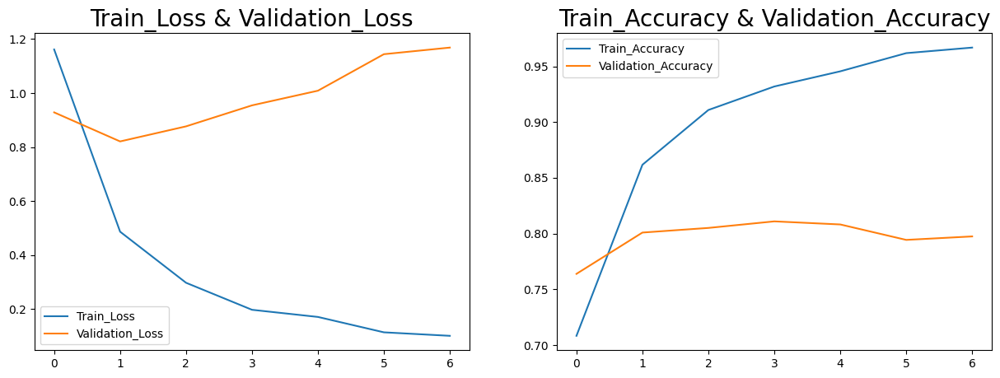

In [19]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(mobile_net_hist_['loss'], label='Train_Loss')
plt.plot(mobile_net_hist_['val_loss'], label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss', fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(mobile_net_hist_['accuracy'], label='Train_Accuracy')
plt.plot(mobile_net_hist_['val_accuracy'], label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy', fontsize=20)
plt.legend()

In [20]:
mobile_net.save(os.path.join(mammals_classification_directory, os.path.join(model_directory_name, 'mobile_net/mobile_net-with-frozen-layers.h5')))

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
for layer in base_mobile_net.layers:
  layer.trainable = True

In [ ]:
optimizer = tf.keras.optimizers.legacy.SGD(lr=0.01, momentum=0.9, decay=0.001)
mobile_net.compile(optimizer = optimizer, loss = 'categorical_crossentropy', metrics = ['accuracy'])

/usr/local/lib/python3.10/dist-packages/keras/src/optimizers/legacy/gradient_descent.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [ ]:
mobile_net_history = mobile_net.fit(train_samples, train_labels_encoded,
                                      batch_size = batch_size,
                                      epochs = 20,
                                      validation_data = (val_samples, val_labels_encoded),
                                      callbacks=[tensorboard, checkpoint, early_stopping])

Epoch 1/20
1204/1204 [==============================] - ETA: 0s - loss: 3.6869 - accuracy: 0.0791
Epoch 1: val_accuracy improved from -inf to 0.02320, saving model to /content/gdrive/MyDrive/mammals_classification/checkpoints/mobile_net/mobile_net_checkpoint.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1204/1204 [==============================] - 39s 26ms/step - loss: 3.6869 - accuracy: 0.0791 - val_loss: 10.6323 - val_accuracy: 0.0232
Epoch 2/20
1202/1204 [============================>.] - ETA: 0s - loss: 3.0315 - accuracy: 0.1870
Epoch 2: val_accuracy improved from 0.02320 to 0.18075, saving model to /content/gdrive/MyDrive/mammals_classification/checkpoints/mobile_net/mobile_net_checkpoint.h5
1204/1204 [==============================] - 30s 25ms/step - loss: 3.0319 - accuracy: 0.1870 - val_loss: 3.7118 - val_accuracy: 0.1807
Epoch 3/20
1203/1204 [============================>.] - ETA: 0s - loss: 2.6308 - accuracy: 0.2821
Epoch 3: val_accuracy improved from 0.18075 to 0.26143, saving model to /content/gdrive/MyDrive/mammals_classification/checkpoints/mobile_net/mobile_net_checkpoint.h5
1204/1204 [==============================] - 27s 23ms/step - loss: 2.6308 - accuracy: 0.2821 - val_loss: 2.8726 - val_accuracy: 0.2614
Epoch 4/20
1203/1204 [============================>.] - ETA: 0s 

In [ ]:
mobile_net_hist_ = pd.DataFrame(mobile_net_history.history)
mobile_net_hist_

,loss,accuracy,val_loss,val_accuracy
0,3.686877,0.079065,10.632333,0.023199
1,3.031887,0.187013,3.711767,0.180748
2,2.630773,0.282078,2.872609,0.261427
3,2.331497,0.363221,3.218959,0.211565
4,2.090672,0.413714,2.678914,0.323061
5,1.838500,0.484156,2.296359,0.390235
6,1.643971,0.529558,2.328373,0.394044
7,1.454994,0.581818,2.191779,0.423476
8,1.257786,0.633351,2.167885,0.454294
9,1.079860,0.678753,2.322220,0.433864


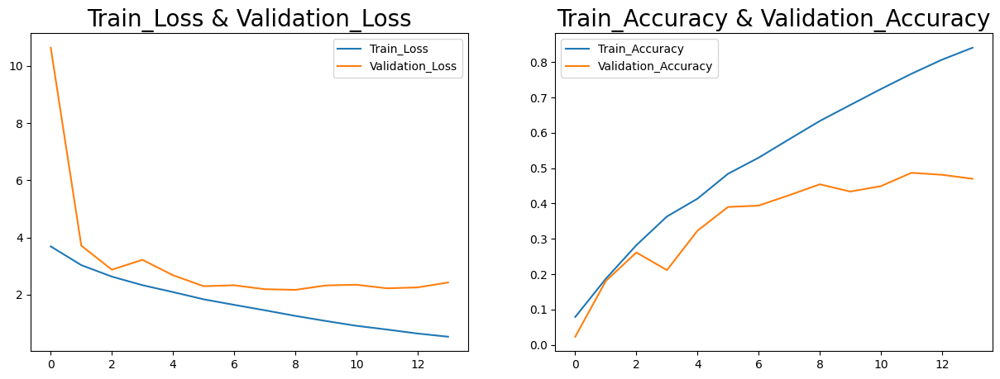

In [ ]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(mobile_net_hist_['loss'], label='Train_Loss')
plt.plot(mobile_net_hist_['val_loss'], label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss', fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(mobile_net_hist_['accuracy'], label='Train_Accuracy')
plt.plot(mobile_net_hist_['val_accuracy'], label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy', fontsize=20)
plt.legend()

Model trained with frozen layers was better than this one, so current model (with all trainable layers) will not be saved.

## Summary

Most promising model is Xception because it has the highest accuracy. ResNet was the worst model for this task. The biggest surprise for me was speed of the MobileNet - this model learned fastest and accuracy is comparable with Xception and Inception's accuracy.

# Performance of best model

In [14]:
xception = load_model(os.path.join(mammals_classification_directory, os.path.join(model_directory_name, 'xception/xception.h5')))

In [15]:
xception_predictions = xception.predict(test_samples)

39/39 [==============================] - 87s 2s/step


In [16]:
f1 = f1_score(np.asarray(test_labels_encoded).argmax(axis=1), np.asarray(xception_predictions).argmax(axis=1), average = 'weighted')
print('Weighted F1 score: ', f1)

Weighted F1 score:  0.9758524575200971


In [17]:
accuracy = accuracy_score(np.asarray(test_labels_encoded).argmax(axis=1), np.asarray(xception_predictions).argmax(axis=1))
print('Accuracy: ', accuracy)

Accuracy:  0.975767366720517


In [18]:
confusion_matrix = tf.math.confusion_matrix(np.asarray(test_labels_encoded).argmax(axis=1), np.asarray(xception_predictions).argmax(axis=1))
print(confusion_matrix)

tf.Tensor(
[[26  0  0 ...  0  0  0]
 [ 0 28  0 ...  1  0  1]
 [ 0  0 29 ...  0  0  0]
 ...
 [ 0  0  0 ... 20  0  0]
 [ 0  0  0 ...  0 20  0]
 [ 0  0  0 ...  0  0 20]], shape=(45, 45), dtype=int32)


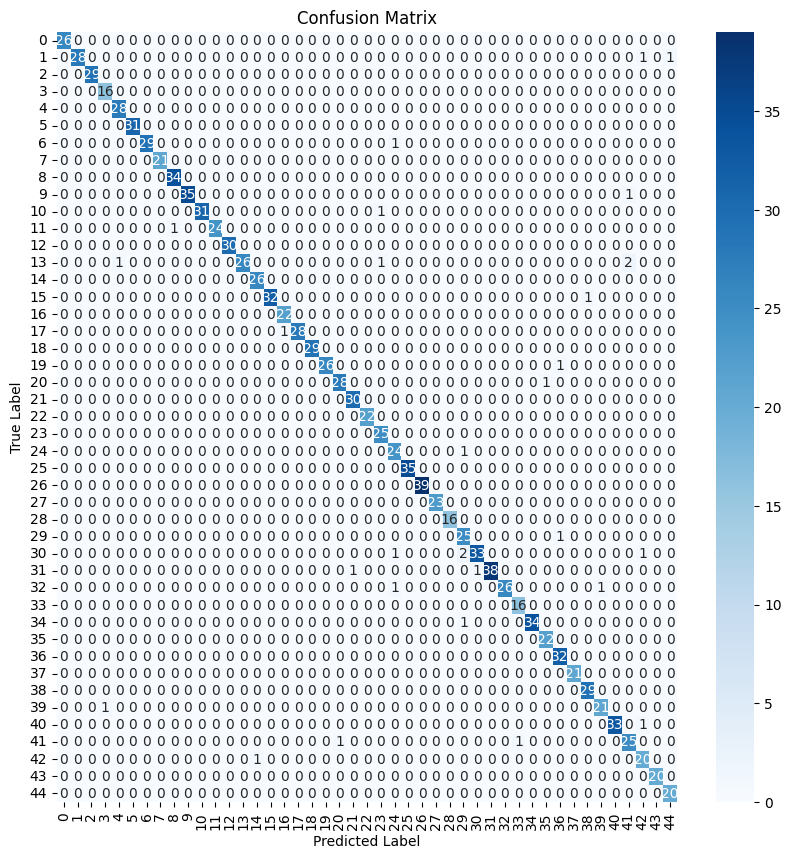

In [19]:
plt.figure(figsize=(10, 10))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=range(num_classes), yticklabels=range(num_classes))
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [20]:
cls_report = classification_report(np.asarray(test_labels_encoded).argmax(axis=1), np.asarray(xception_predictions).argmax(axis=1))
print(cls_report)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        26
           1       1.00      0.93      0.97        30
           2       1.00      1.00      1.00        29
           3       0.94      1.00      0.97        16
           4       0.97      1.00      0.98        28
           5       1.00      1.00      1.00        31
           6       1.00      0.97      0.98        30
           7       1.00      1.00      1.00        21
           8       0.97      1.00      0.99        34
           9       1.00      0.97      0.99        36
          10       1.00      0.97      0.98        32
          11       1.00      0.96      0.98        25
          12       1.00      1.00      1.00        30
          13       1.00      0.87      0.93        30
          14       0.96      1.00      0.98        26
          15       1.00      0.97      0.98        33
          16       0.96      1.00      0.98        22
          17       1.00    

# Conclusions

The best model of trained ones was Xception. Accuracy on test dataset is about 97.58% and weighted F1 score is about 97.59%.

There are many options to improve accuracy but I can't affors to do this due to lack of RAM. There is possibility to regularize Xception model (check which optimizer will be the best one, experiment with learning rate, momentum and decay). There is also possibility to concatenate two or three best models into one ensemble model.

The reason why models haven't higher accuracy is that input shapes of images in training dataset were different than expected ones (DenseNet, MobileNet, ResNet and VGG expect size = (224, 224), Inception and Xception - (299, 299)). I couldn't perform training of such a image sizes because of lack of RAM for such a calculations.

The reason why models with all trainable layers were worse than the with frozen ones might be too much features for such a data.